In [2]:
import numpy as np
import nm_lib as nm

from matplotlib import style
import matplotlib.pyplot as plt

from matplotlib.animation import FuncAnimation
from IPython.display import HTML

import importlib
style.use('dark_background')


# Space-time partial differential equation: Study of the diffusive equation (implicit methods)

Let's consider now the viscous term in Burger's equation: 

$$\frac{\partial u}{\partial t} = \nu \frac{\partial^2 u}{\partial x^2}, \tag{1}$$

## 1- Apply an explicit method. 

What would be the CFL condition for a viscous term where $\nu$ is either a constant or an array that depends on $x$. We would like to solve equation (1) numerically for $x  [x_0, x_f]$ with $x_0 = −2.6$, $x_f = 2.6$, periodic boundary conditions and with the initial condition:

$$u(x,t=t_0) = A\exp(-(x-x_0)^2/W^2)   \tag{2}$$

with $A=0.3$, $W=0.1$, and $x_0=0$. __Suggestion__: Apply the first derivative upwind and the second downwind. Apply Von Newman analysis. Is it stable? What is the time-step dependence with $\Delta x$? 

How many steps are needed to reach a $t=1.8$ for $nump=128$? And $256$? 

<img src="./ex_5a_handwritten.jpg" />

In [3]:

def n_timesteps(dx,v,tf,cfl_cut=0.98):
    dt = cfl_cut*0.5*dx*dx/v
    return int(np.floor(tf/dt))

n = np.array([128,256])
nump = n+1
v = [1,1]
tf = [1.8,1.8]

steps = [n_timesteps(1/numpoints,v,tf) for numpoints,v,tf in zip(nump,v,tf)]

for npoints, step in zip(n,steps):
    print(f"With nump = {npoints} we need {step:.2E} timesteps")


With nump = 128 we need 6.11E+04 timesteps
With nump = 256 we need 2.43E+05 timesteps


Using $\Delta t = \frac{\Delta x ^2}{\nu}$ we obtain almost an order of magnitude more timesteps for doubling the amount of points. 

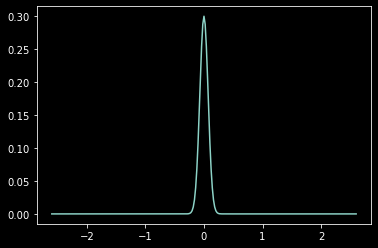

In [4]:
def ut0(xx,A,x0,W):
    x2term = (xx-x0)**2
    W2term =W*W
    paranthesis = -x2term/W2term
    return A*np.exp(paranthesis)

xs = -2.6
xf = 2.6
A = 0.3
W = 0.1
x0 = 0
nump = 256

xx = np.linspace(xs,xf, nump+1)

u0 = ut0(xx,A,x0,W)

plt.plot(xx,u0)

In [5]:
def step_d2dx2(xx,hh,v,cfl_cut):
    dx = xx[1]-xx[0]
    dt = cfl_cut*0.5*dx*dx/np.amax(v)
    u_next = hh + (v*dt/(dx*dx)) * (np.roll(hh,1) - 2*hh + np.roll(hh,-1))
    u_next = np.pad(u_next[1:-1], [1, 1], "wrap")
    return dt, u_next

def evolve_d2dx2(xx,hh,v,cfl_cut=0.98,nt=100,tf=None):
    x_len = xx.shape[0]
    if v == "hh":
        v = hh
    v_a = np.amax(np.abs(v))
    if tf is not None:
        nt = n_timesteps(1/x_len,v_a,tf,cfl_cut=cfl_cut)
        print(f"final time {tf} requires {nt} timesteps")
    uunt = np.zeros((nt,x_len))
    tt = np.zeros(nt)

    uunt[0] = hh

    for i in range(nt-1):
        if v == "hh":
            dt, step = step_d2dx2(xx,uunt[i],uunt[i],cfl_cut)
        else:
            dt, step = step_d2dx2(xx,uunt[i],v,cfl_cut)
        uunt[i+1] = step
        tt[i+1] = tt[i] + dt
        if tf and tt[i]>tf:
            print(f"exceeded final time {tf:.3f} at {tt[i+1]:.3f}")
            uunt = uunt[0:i+1]
            tt = tt[0:i+1]
            break

    return tt,uunt



In [220]:
nump = 128

xx = np.linspace(xs,xf, nump+1)
u0 = ut0(xx,A,x0,W)

t, ut = evolve_d2dx2(xx,u0,1,tf=1.8, cfl_cut=0.98) 
nm.anim(ut,xx,t, log_time=True)

final time 1.8 requires 61130 timesteps
exceeded final time 1.800 at 1.801


In [221]:
nump = 256

xx = np.linspace(xs,xf, nump+1)
u0 = ut0(xx,A,x0,W)

t, ut = evolve_d2dx2(xx,u0,1,tf=1.8, cfl_cut=0.98) 
nm.anim(ut,xx,t, log_time=True)

final time 1.8 requires 242628 timesteps
exceeded final time 1.800 at 1.800


Here, we see that the scheme is diffusive and decreases in amplitude. The solutions look the same for both 128 and 256 points.

## Choose one of the following options: 

## 2- Implicit methods.

In the [wiki](https://github.com/AST-Course/AST5110/wiki/Implicit-methods), we describe some implicit or semi-explicit methods that allow relaxing the CFL constraint on diffusive terms. Consider Newton-Rapson method and repeat the previous numerical experiment. For this, you will need to implement the following   


$F_j = u^{n+1}_j - u^n_j - \nu \, (u^{n+1}_{j+1} - 2u^{n+1}_{j}+u^{n+1}_{j-1})\frac{\Delta t}{\Delta x^2}$

in `NR_f` and `step_diff_burgers` functions in `nm_lib`. 

And the Jacobian can be easily built. 

$J(j,k) = F_j'(u^{n+1}_k)$

fill in the `jacobian` function in `nm_lib`. Note that this matrix is linear with $u$. 

Test the model with [wiki](https://github.com/AST-Course/AST5110/wiki/Self-similar-solution-for-parabolic-eq) self-similar solutions. How long it takes each time step compared to the Lax-method? Use `time.time` library. Do it for nump=256, nt=30 and dt = 0.1. In order to test the simulation, use `curve_fit` from `scipy.optimize`. 

__hint__ consider to use a good initial guess (`p0`) in and `bnd_limits` to facilitate the fitting wiht `curve_fit`. What happens to the solution when increasing dt? How much can be improved in limiting the tolerance?

In [112]:
importlib.reload(nm)

F = nm.jacobian(xx,ut[:4,:4],1,0.1)
print("F: \n",F)


F: 
 [[ 0.8 -0.1  0.   0. ]
 [-0.1  0.8 -0.1  0. ]
 [ 0.  -0.1  0.8 -0.1]
 [ 0.   0.  -0.1  0.8]]


In [116]:
importlib.reload(nm)

F = nm.jacobian_u(xx,ut[0,:4],0.1)
print("F: \n",F)

F: 
 [[ 1.00000000e+000 -7.83522528e-296  0.00000000e+000  0.00000000e+000]
 [-2.90648486e-291  1.00000000e+000 -2.90648486e-291  0.00000000e+000]
 [ 0.00000000e+000 -9.92765929e-287  1.00000000e+000 -9.92765929e-287]
 [ 0.00000000e+000  0.00000000e+000 -7.83522528e-296  1.00000000e+000]]


----------------------------------------------

In [216]:
importlib.reload(nm)

nump = 128
nt = 30
xx = np.linspace(xs,xf, nump+1)
u0 = ut0(xx,A,x0,W)
a=1
dt=0.1

t, uunt, errt, countt = nm.Newton_Raphson(xx,u0,a,dt,30,toll=1e-4,ncount=3) 
nm.anim(uunt.T,xx,t, log_time=True)

In [217]:
importlib.reload(nm)

tt,uunt_diffburg = nm.evolv_uadv_burgers(xx, u0, nt, diff=True)
db_dt = tt[nt-1]/nt
print(f"dt for diff burg: {db_dt:.7f}")
nm.anim(uunt_diffburg,xx,tt)

dt for diff burg: 0.0074649


Let's consider a non-linear function where $\nu$ depends on $u$. To keep it simple, solve the following: 

$\frac{\partial u}{\partial t} = u \frac{\partial^2 u}{\partial x^2}$

where $\nu_0$ is a constant and the same initial conditions as the previous exercise (fill in `Newton_Raphson_u`, `jacobian_u` and `NR_f_u`. Consider an error limit of $10^{-4}$ and compare the previous exercise (with the same error limit). How many iterations needs now the method to converge to the right solution? Why? Increase `ncount` to 1000. 

In [270]:
import time
importlib.reload(nm)
#dt = 0.0074649
nump = 128
nt = 30
xx = np.linspace(xs,xf, nump+1)
u0 = ut0(xx,A,x0,W)
dt = 0.1
t0 = time.perf_counter()
t, uunt, errt, countt = nm.Newton_Raphson_u(xx,u0,dt,30,toll=1e-4,ncount=1000) 
tottime = (time.perf_counter() - t0)
totit = sum(countt)
print("nump = ", nump)
print(f"total iterations = {totit}   total time = {tottime:.3f}   time per it = {tottime/totit:.3e}   avg err = {np.mean(errt):.3e}")

nump = 256
nt = 30
xx = np.linspace(xs,xf, nump+1)
u0 = ut0(xx,A,x0,W)
dt = 0.1
t0 = time.perf_counter()
t, uunt, errt, countt = nm.Newton_Raphson_u(xx,u0,dt,30,toll=1e-4,ncount=1000) 
tottime = (time.perf_counter() - t0)
totit = sum(countt)
print("nump = ", nump)
print(f"total iterations = {totit}   total time = {tottime:.3f}   time per it = {tottime/totit:.3e}   avg err = {np.mean(errt):.3e}")
#nm.animMult([uunt.T,uunt_diffburg],xx,["NR","adv_burg"],["-","--"],t)


nump =  128
total iterations = 122.0   total time = 0.804   time per it = 6.587e-03   avg err = 3.562e-05
nump =  256
total iterations = 274.0   total time = 3.876   time per it = 1.415e-02   avg err = 6.286e-05


In [240]:
nm.anim(uunt.T,xx,t)

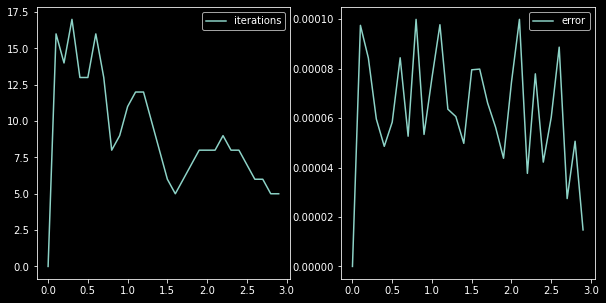

In [241]:
fig,ax = plt.subplots(1,2, figsize = (10,5))
ax[0].plot(t,countt,label="iterations")
ax[1].plot(t,errt,label="error")
lgnd = ax[0].legend(), ax[1].legend()

the peaks decrease with t^-0.527
the full width half max increase with t^0.585


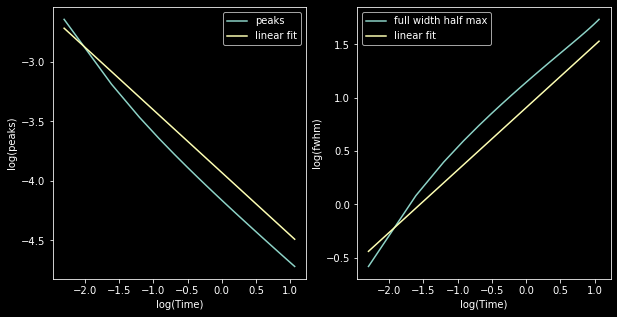

In [319]:
from scipy.interpolate import UnivariateSpline
    
def selfsimilar(xx,uunt,t):    
    peaks = [np.amax(hh) for hh in uunt]

    def width_fwhm(xx,hh):
        peak = np.amax(hh)
        combined = hh-0.5*peak
        spline = UnivariateSpline(xx, combined, s=0)
        try:
            r1, r2 = spline.roots() # find the roots
            return r2-r1
        except ValueError:
            raise(ValueError("Domain too narrow, increase the range of xx"))
            return None

    widths = [width_fwhm(xx,hh) for hh in uunt]

    tlog = np.ma.log(t)
    peaklog = np.ma.log(peaks)
    widthlog = np.ma.log(widths)

    #The weights assume that the first values are best and should be weighted as the final values apporach 0 and the steady state
    m_peak,b_peak = np.polyfit(tlog,peaklog,deg = 1, w=np.sqrt(np.flip(t)))
    m_width,b_width = np.polyfit(tlog,widthlog,deg = 1, w = np.sqrt(np.flip(t)))
    print(f"the peaks decrease with t^{m_peak:.3f}")
    print(f"the full width half max increase with t^{m_width:.3f}")

    """
    fig,ax = plt.subplots(1,2, figsize = (10,5))
    ax[0].plot(t,peaks,label="peaks")
    ax[1].plot(t,widths,label="full width half max")
    ax[0].set_ylabel("peaks")
    ax[1].set_ylabel("fwhm")
    for axx in ax:
        axx.set_yscale("log")
        axx.set_xscale("log")
        axx.set_xlabel("Time")
    
    lgnd = ax[0].legend(), ax[1].legend()
    """
    fig,ax = plt.subplots(1,2, figsize = (10,5))
    ax[0].plot(tlog,peaklog,label="peaks")
    ax[0].plot(tlog,np.polyval([m_peak,b_peak],tlog), label="linear fit")
    ax[1].plot(tlog,widthlog,label="full width half max")
    ax[1].plot(tlog,np.polyval([m_width,b_width],tlog), label="linear fit")
    ax[0].set_ylabel("log(peaks)")
    ax[1].set_ylabel("log(fwhm)")
    for axx in ax:
        axx.set_xlabel("log(Time)")

    


    lgnd = ax[0].legend(), ax[1].legend()

selfsimilar(xx,uunt.T,t)

From the self-similar solutions the peaks should decrease with $t^{-1/2}$ and the full width half max should increase with $t^{1/2}$. Our values are close, but not the exact same. Whether this is satisfactory or not I'm not sure, let's try to decrease the error tol and see again.

nump =  128
total iterations = 27012.0   total time = 71.765   time per it = 2.657e-03   avg err = 2.620e-03
the peaks decrease with t^-0.529
the full width half max increase with t^0.591


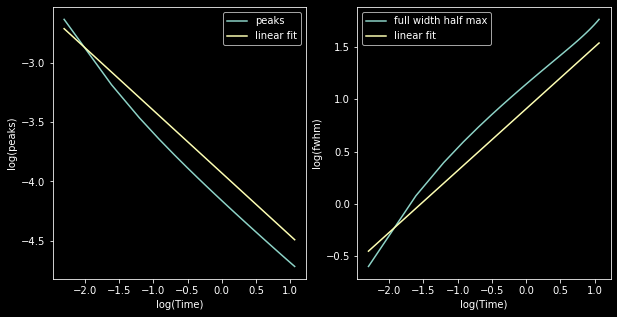

In [328]:
nump = 128
xs = -4.6
xf = 4.6
nt = 30
xx = np.linspace(xs,xf, nump+1)
u0 = ut0(xx,A,x0,W)
dt = 0.1
a=1
t0 = time.perf_counter()
t, uunt, errt, countt = nm.Newton_Raphson(xx,u0,a,dt,30,toll=1e-4,ncount=1000) 
tottime = (time.perf_counter() - t0)
totit = sum(countt)
print("nump = ", nump)
print(f"total iterations = {totit}   total time = {tottime:.3f}   time per it = {tottime/totit:.3e}   avg err = {np.mean(errt):.3e}")

selfsimilar(xx,uunt.T,t)

Trying without $\nu = u(x,t)$ to see if we get closer to the self-similar solution.

nump =  128
total iterations = 27012.0   total time = 71.765   time per it = 2.657e-03   avg err = 2.331e-03
the peaks decrease with t^-0.506
the full width half max increase with t^0.519


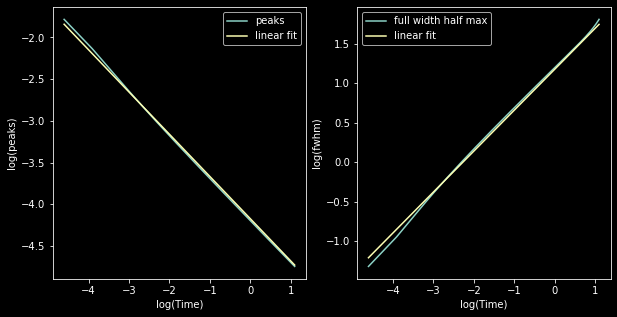

In [329]:
importlib.reload(nm)
xs = -4.6
xf = 4.6
nump = 128
nt = 300
xx = np.linspace(xs,xf, nump+1)
u0 = ut0(xx,A,x0,W)
a=1
dt=0.01

t, uunt, errt, countt = nm.Newton_Raphson(xx,u0,a,dt,nt,toll=1e-4,ncount=1000) 
print("nump = ", nump)
print(f"total iterations = {totit}   total time = {tottime:.3f}   time per it = {tottime/totit:.3e}   avg err = {np.mean(errt):.3e}")
#nm.anim(uunt.T,xx,t)
selfsimilar(xx,uunt.T,t)

For the simple case where $\nu = 1$ we get very good match with the self-similar solution. When $\nu$ is a function of $u(x,t)$ it changes particularly how the full width max height varies in time, as seen in the animations where the width doesn't increase as much when $\nu = u(x,t)$.

Changing the error tolerance does not significantly impact the dependency on $t$ compared to the self-similar solution. However, increased resolution in time makes a better approximation for the time dependency compared to the self-similar theory.

With the good corresponsance with the self-similar solution, we can assume that the NF method has been successfully implemented.

The drawback however is very long computational time... The lax and burgers methods compute 30 timesteps in less than a second, while the NF takes minutes.

## 3- Semi-explicit methods. 

__a)__ Super-time-stepping (STS) schemes work for parabolic terms. STS is an API method that performs a subset of "unstable" intermediate steps, but the sum of all the steps is stable. Visualize how `taui_sts` varies with $nu$ and $niter$. Compare the solution with the analytical one for the final and intermediate STS steps. For the full STS steps, how improves the solution with $nu$? and $niter$? Is there a relation between the error and these two parameters, $nu$, and $niter$? For which $niter$ and $nu$ the method provides larger steps than an ordinary explicit. For this exercise, fill in `evol_sts`, and `taui_sts`. 